In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_excel('DAILY indicators copia.xlsx',engine='openpyxl')
df.rename(columns={'key_0':'Date'},inplace=True)
df.index = pd.to_datetime(df['Date'],format='%Y-%m-%d')
df.drop(['Date'],axis=1,inplace=True)
df

,High,Low,Open,Close,Volume,Adj Close,Price close,EMA,SMA,WMA,MA,RSI,SlowD,SlowK,ATR,ROC
Date,,,,,,,,,,,,,,,,
1999-12-31,104.684509,101.935944,104.385757,103.130974,3002334,60.405579,61.780476,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-03,110.898659,106.955070,107.492828,110.898659,10823694,64.955292,66.433693,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-04,109.464630,105.999046,108.986618,107.134323,8606279,62.750420,64.178642,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-05,114.483749,107.194077,107.970840,110.898659,13318927,64.955292,66.433693,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2000-01-06,113.706978,108.508606,112.810707,108.986618,8338607,63.835339,65.288307,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-07,137.820007,136.270004,137.449997,137.240005,3759000,135.606552,135.606552,131.533455,132.651808,132.879527,132.651808,58.931005,82.408906,78.442040,3.013104,6.536247
2022-02-08,137.520004,135.779999,137.229996,137.020004,4181800,135.389175,135.389175,131.782211,132.829666,133.056132,132.829666,58.574335,76.567142,66.274871,2.922168,0.675979
2022-02-09,138.350006,136.830002,137.839996,137.789993,5393500,136.149994,136.149994,132.064004,132.999619,133.270346,132.999619,59.463690,69.411898,63.518784,2.822014,2.629220


In [3]:
df.dropna(axis=0,inplace=True)
df

,High,Low,Open,Close,Volume,Adj Close,Price close,EMA,SMA,WMA,MA,RSI,SlowD,SlowK,ATR,ROC
Date,,,,,,,,,,,,,,,,
2000-02-11,114.184990,109.524376,113.826485,110.301147,6013872,64.676430,66.145264,66.544556,66.544556,66.647200,66.544556,55.255583,72.987851,62.893079,4.555714,3.526196
2000-02-14,111.257172,109.464630,110.898659,110.958412,4753024,65.061829,66.539436,66.544226,66.703188,66.646870,66.703188,55.691200,66.168044,51.430031,4.358345,3.505276
2000-02-15,112.272942,108.867111,110.779160,111.974190,5415665,65.657440,67.148605,66.583218,66.727019,66.675607,66.727019,56.371078,51.334738,39.681102,4.290308,6.589348
2000-02-16,112.153442,110.181641,111.376671,110.659653,4149377,64.886665,66.360268,66.568834,66.799740,66.651945,66.799740,55.235098,43.569139,39.596284,4.124700,2.089676
2000-02-17,113.647224,110.659653,111.376671,111.615677,5478425,65.447205,66.933594,66.592367,66.816403,66.660581,66.816403,55.904425,42.060506,46.904131,4.043477,-0.215274
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-02-07,137.820007,136.270004,137.449997,137.240005,3759000,135.606552,135.606552,131.533455,132.651808,132.879527,132.651808,58.931005,82.408906,78.442040,3.013104,6.536247
2022-02-08,137.520004,135.779999,137.229996,137.020004,4181800,135.389175,135.389175,131.782211,132.829666,133.056132,132.829666,58.574335,76.567142,66.274871,2.922168,0.675979
2022-02-09,138.350006,136.830002,137.839996,137.789993,5393500,136.149994,136.149994,132.064004,132.999619,133.270346,132.999619,59.463690,69.411898,63.518784,2.822014,2.629220


In [4]:
df.columns

Index(['High', 'Low', 'Open', 'Close', 'Volume', 'Adj Close', 'Price close',
       'EMA', 'SMA', 'WMA', 'MA', 'RSI', 'SlowD', 'SlowK', 'ATR', 'ROC'],
      dtype='object')

In [5]:
df = df[['Adj Close','EMA', 'SMA', 'WMA', 'MA', 'RSI', 'SlowD', 'SlowK', 'ATR', 'ROC']]

In [6]:
df

,Adj Close,EMA,SMA,WMA,MA,RSI,SlowD,SlowK,ATR,ROC
Date,,,,,,,,,,
2000-02-11,64.676430,66.544556,66.544556,66.647200,66.544556,55.255583,72.987851,62.893079,4.555714,3.526196
2000-02-14,65.061829,66.544226,66.703188,66.646870,66.703188,55.691200,66.168044,51.430031,4.358345,3.505276
2000-02-15,65.657440,66.583218,66.727019,66.675607,66.727019,56.371078,51.334738,39.681102,4.290308,6.589348
2000-02-16,64.886665,66.568834,66.799740,66.651945,66.799740,55.235098,43.569139,39.596284,4.124700,2.089676
2000-02-17,65.447205,66.592367,66.816403,66.660581,66.816403,55.904425,42.060506,46.904131,4.043477,-0.215274
...,...,...,...,...,...,...,...,...,...,...
2022-02-07,135.606552,131.533455,132.651808,132.879527,132.651808,58.931005,82.408906,78.442040,3.013104,6.536247
2022-02-08,135.389175,131.782211,132.829666,133.056132,132.829666,58.574335,76.567142,66.274871,2.922168,0.675979
2022-02-09,136.149994,132.064004,132.999619,133.270346,132.999619,59.463690,69.411898,63.518784,2.822014,2.629220


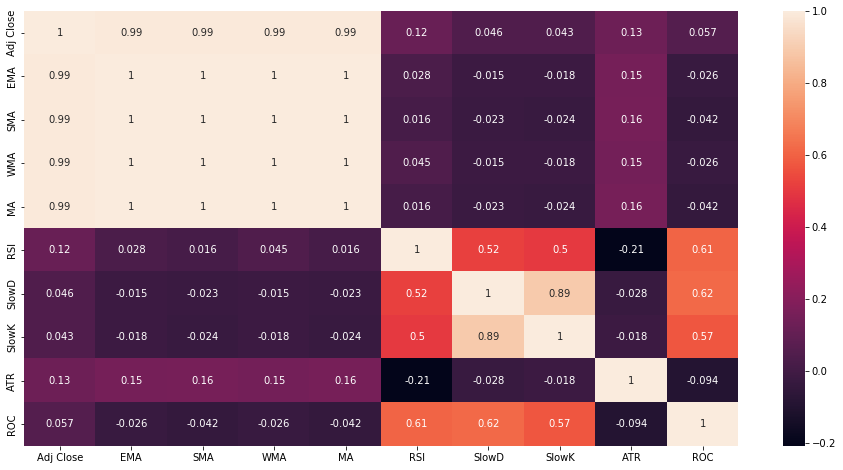

In [7]:
corr = df.corr()
corr
fig = plt.figure(figsize=(16, 8))
sns.heatmap(corr, annot=True, annot_kws={"fontsize":10})

In [8]:
df = df[['Adj Close', 'MA', 'RSI', 'SlowD', 'SlowK', 'ATR', 'ROC']]

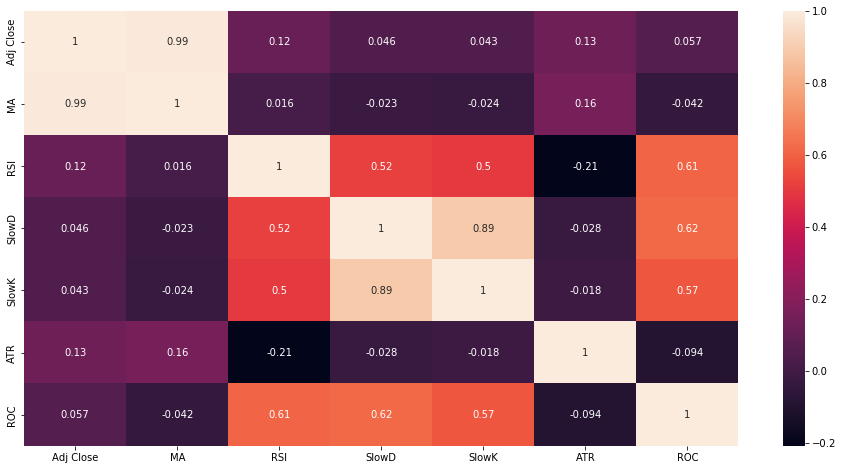

In [9]:
corr2 = df.corr()
corr2
fig = plt.figure(figsize=(16, 8))
sns.heatmap(corr2, annot=True, annot_kws={"fontsize":10})

In [10]:
q_70 = int(len(df.index) * .7)
df_train = df[:q_70]
df_test = df[q_70:]

In [11]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))
scaler = scaler.fit(df_train)
df_scaled = scaler.transform(df_train)
df_scaled.shape

(3875, 7)

In [12]:
def Create_X_y(i):
    global X
    X=[]
    global y
    y=[]
    
    windowsize = [5,10,20,30,60]
    n_feature = 1 
    n_past = windowsize[i]
    
    for i in range(n_past,len(df_scaled)-n_feature+1):
        X.append(df_scaled[i-n_past:i, 0:df_scaled.shape[1]])
        y.append(df_scaled[i+n_feature-1:i+n_feature, 0])  #nella prima colonna (0 index) sta il adj close
    return X, y

In [13]:
Create_X_y(0)

([array([[0.29800615, 0.27453328, 0.65551751, 0.7323172 , 0.62215098,
          0.66840594, 0.48473988],
         [0.30144991, 0.27604566, 0.66278378, 0.6605462 , 0.50542608,
          0.63209336, 0.48440236],
         [0.30677204, 0.27627285, 0.67412444, 0.50444192, 0.38579014,
          0.61957577, 0.53415843],
         [0.29988473, 0.27696616, 0.6551758 , 0.42271751, 0.38492646,
          0.58910683, 0.46156415],
         [0.30489347, 0.27712503, 0.66634048, 0.4068408 , 0.45934015,
          0.57416311, 0.42437784]]),
  array([[0.30144991, 0.27604566, 0.66278378, 0.6605462 , 0.50542608,
          0.63209336, 0.48440236],
         [0.30677204, 0.27627285, 0.67412444, 0.50444192, 0.38579014,
          0.61957577, 0.53415843],
         [0.29988473, 0.27696616, 0.6551758 , 0.42271751, 0.38492646,
          0.58910683, 0.46156415],
         [0.30489347, 0.27712503, 0.66634048, 0.4068408 , 0.45934015,
          0.57416311, 0.42437784],
         [0.28360508, 0.27687357, 0.60875818, 0.38334

In [14]:
X, y =np.array(X), np.array(y)
df_scaled.shape, X.shape, y.shape

((3875, 7), (3870, 5, 7), (3870, 1))

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError

model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))

model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])

In [16]:
model.fit(X, y, epochs=20, batch_size=64)

Train on 3870 samples
Epoch 1/20
3870/3870 [==============================] - 5s 1ms/sample - loss: 0.0137 - mean_absolute_error: 0.0654
Epoch 2/20
3870/3870 [==============================] - 2s 419us/sample - loss: 4.7384e-04 - mean_absolute_error: 0.0157
Epoch 3/20
3870/3870 [==============================] - 2s 419us/sample - loss: 3.8336e-04 - mean_absolute_error: 0.0141
Epoch 4/20
3870/3870 [==============================] - 2s 417us/sample - loss: 3.2457e-04 - mean_absolute_error: 0.0129
Epoch 5/20
3870/3870 [==============================] - 2s 422us/sample - loss: 2.9191e-04 - mean_absolute_error: 0.0122
Epoch 6/20
3870/3870 [==============================] - 2s 419us/sample - loss: 2.6333e-04 - mean_absolute_error: 0.0116
Epoch 7/20
3870/3870 [==============================] - 2s 418us/sample - loss: 2.9849e-04 - mean_absolute_error: 0.0125
Epoch 8/20
3870/3870 [==============================] - 2s 418us/sample - loss: 2.5567e-04 - mean_absolute_error: 0.0115
Epoch 9/20
3870/

In [17]:
dataset_total = pd.concat((df_train,df_test), axis=0)

In [18]:
inputs = dataset_total[len(dataset_total)-len(df_test)-5:].values

In [19]:
inputs.shape

(1667, 7)

In [20]:
inputs = scaler.transform(inputs)

In [21]:
X_test = []
for i in range(5,len(inputs)):
    X_test.append(inputs[i-5:i, :]) #colonne tutte perchè è X , y solo il adj close

In [22]:
X_test = np.array(X_test)

In [23]:
X_test.shape

(1662, 5, 7)

In [24]:
test_predictions5 = model.predict(X_test)

In [25]:
forecast_copies = np.repeat(test_predictions5, df_scaled.shape[1], axis=-1)
y_pre5 = scaler.inverse_transform(forecast_copies)[:,0]  #0 perchè la colonna dei adj close è questa
y_pre5

array([115.74544 , 115.99687 , 117.696915, ..., 135.87642 , 135.78172 ,
       134.77017 ], dtype=float32)

In [26]:
y_test = df_test['Adj Close'].values

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


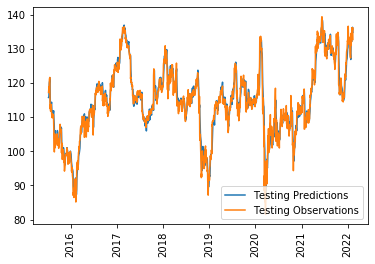

In [27]:
plt.plot(df_test.index, y_pre5)
plt.plot(df_test.index, y_test)
plt.xticks(rotation=90)
plt.legend(['Testing Predictions', 'Testing Observations'])

In [28]:
test_results5 = pd.DataFrame(data={'Test Predictions':y_pre5, 'Actuals':y_test},index=df_test.index)
test_results5

,Test Predictions,Actuals
Date,,
2015-07-10,115.745438,117.197418
2015-07-13,115.996872,118.903267
2015-07-14,117.696915,118.362709
2015-07-15,119.231918,118.306519
2015-07-16,119.786491,120.040489
...,...,...
2022-02-07,135.848083,135.606552
2022-02-08,136.265656,135.389175
2022-02-09,135.876419,136.149994


In [30]:
rmse5=np.sqrt(np.mean(((test_results5['Test Predictions']- test_results5['Actuals'])**2)))
mae5 = np.mean(np.abs(test_results5['Test Predictions']-test_results5['Actuals']))
MAPE5 = np.mean(np.abs(((test_results5['Test Predictions']-test_results5['Actuals'])/test_results5['Actuals'])*100))
from sklearn.metrics import r2_score
r2_5 = r2_score(test_results5['Actuals'], test_results5['Test Predictions'])
rmse5, mae5, MAPE5, r2_5

(2.3312574872454164,
 1.6026185560169048,
 1.4376705114626578,
 0.9502403854118231)

In [31]:
Create_X_y(1)

([array([[0.29800615, 0.27453328, 0.65551751, 0.7323172 , 0.62215098,
          0.66840594, 0.48473988],
         [0.30144991, 0.27604566, 0.66278378, 0.6605462 , 0.50542608,
          0.63209336, 0.48440236],
         [0.30677204, 0.27627285, 0.67412444, 0.50444192, 0.38579014,
          0.61957577, 0.53415843],
         [0.29988473, 0.27696616, 0.6551758 , 0.42271751, 0.38492646,
          0.58910683, 0.46156415],
         [0.30489347, 0.27712503, 0.66634048, 0.4068408 , 0.45934015,
          0.57416311, 0.42437784],
         [0.28360508, 0.27687357, 0.60875818, 0.38334822, 0.31759736,
          0.58698464, 0.38589977],
         [0.27609143, 0.27643982, 0.58944533, 0.34672277, 0.27861237,
          0.59182323, 0.38532626],
         [0.26482107, 0.27477714, 0.56107614, 0.22684238, 0.11135887,
          0.56883311, 0.29121595],
         [0.27358679, 0.27325129, 0.58294857, 0.16523859, 0.13877772,
          0.55141133, 0.33335382],
         [0.26106419, 0.27117895, 0.55147668, 0.1236353

In [32]:
X, y =np.array(X), np.array(y)
df_scaled.shape, X.shape, y.shape

((3875, 7), (3865, 10, 7), (3865, 1))

In [33]:
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])

In [34]:
model.fit(X, y, epochs=20, batch_size=64)

Train on 3865 samples
Epoch 1/20
3865/3865 [==============================] - 6s 2ms/sample - loss: 0.0197 - mean_absolute_error: 0.0803
Epoch 2/20
3865/3865 [==============================] - 3s 762us/sample - loss: 6.4332e-04 - mean_absolute_error: 0.0190
Epoch 3/20
3865/3865 [==============================] - 3s 761us/sample - loss: 4.2310e-04 - mean_absolute_error: 0.0149
Epoch 4/20
3865/3865 [==============================] - 3s 759us/sample - loss: 3.5220e-04 - mean_absolute_error: 0.0134
Epoch 5/20
3865/3865 [==============================] - 3s 807us/sample - loss: 3.2922e-04 - mean_absolute_error: 0.0130
Epoch 6/20
3865/3865 [==============================] - 4s 1ms/sample - loss: 3.2215e-04 - mean_absolute_error: 0.0129
Epoch 7/20
3865/3865 [==============================] - 5s 1ms/sample - loss: 2.9052e-04 - mean_absolute_error: 0.0121
Epoch 8/20
3865/3865 [==============================] - 6s 1ms/sample - loss: 2.9832e-04 - mean_absolute_error: 0.0124
Epoch 9/20
3865/3865 [

In [35]:
inputs = dataset_total[len(dataset_total)-len(df_test)-10:].values
inputs.shape

(1672, 7)

In [36]:
inputs = scaler.transform(inputs)
inputs

array([[0.76185404, 0.78834044, 0.53861921, ..., 0.22396321, 0.20363178,
        0.40204226],
       [0.75796518, 0.78639991, 0.52439116, ..., 0.01941386, 0.19681104,
        0.41306868],
       [0.742346  , 0.78407533, 0.47024124, ..., 0.00203462, 0.20291568,
        0.39592541],
       ...,
       [0.93666333, 0.90810646, 0.72571056, ..., 0.62852235, 0.34943492,
        0.47026874],
       [0.91316286, 0.90866488, 0.65491316, ..., 0.39498118, 0.37306333,
        0.45960504],
       [0.90574632, 0.90878367, 0.63391381, ..., 0.24480076, 0.36490975,
        0.42531192]])

In [37]:
X_test = []
for i in range(10,len(inputs)):
    X_test.append(inputs[i-10:i, :])

In [38]:
X_test = np.array(X_test)

In [39]:
test_predictions10 = model.predict(X_test)

In [40]:
forecast_copies = np.repeat(test_predictions10, df_scaled.shape[1], axis=-1)
y_pre10 = scaler.inverse_transform(forecast_copies)[:,0]  #0 perchè la colonna dei adj close è questa
y_pre10

array([116.37258, 116.18002, 117.04527, ..., 135.1622 , 135.36856,
       134.69904], dtype=float32)

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


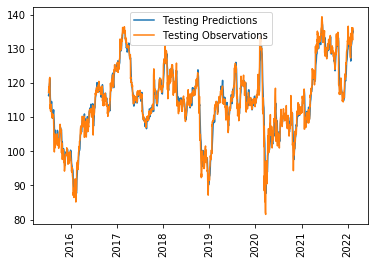

In [41]:
plt.plot(df_test.index, y_pre10)
plt.plot(df_test.index, y_test)
plt.xticks(rotation=90)
plt.legend(['Testing Predictions', 'Testing Observations'])

In [42]:
test_results10 = pd.DataFrame(data={'Test Predictions':y_pre10, 'Actuals':y_test},index=df_test.index)
test_results10

,Test Predictions,Actuals
Date,,
2015-07-10,116.372581,117.197418
2015-07-13,116.180023,118.903267
2015-07-14,117.045273,118.362709
2015-07-15,118.166534,118.306519
2015-07-16,118.861237,120.040489
...,...,...
2022-02-07,134.457611,135.606552
2022-02-08,135.210190,135.389175
2022-02-09,135.162201,136.149994


In [43]:
rmse10=np.sqrt(np.mean(((test_results10['Test Predictions']- test_results10['Actuals'])**2)))
mae10 = np.mean(np.abs(test_results10['Test Predictions']-test_results10['Actuals']))
MAPE10 = np.mean(np.abs(((test_results10['Test Predictions']-test_results10['Actuals'])/test_results10['Actuals'])*100))
r2_10 = r2_score(test_results10['Actuals'], test_results10['Test Predictions'])
rmse10, mae10, MAPE10, r2_10

(2.5347109213942556, 1.7427823678394225, 1.5601081059024857, 0.941176157231387)

In [44]:
Create_X_y(2)

([array([[0.29800615, 0.27453328, 0.65551751, 0.7323172 , 0.62215098,
          0.66840594, 0.48473988],
         [0.30144991, 0.27604566, 0.66278378, 0.6605462 , 0.50542608,
          0.63209336, 0.48440236],
         [0.30677204, 0.27627285, 0.67412444, 0.50444192, 0.38579014,
          0.61957577, 0.53415843],
         [0.29988473, 0.27696616, 0.6551758 , 0.42271751, 0.38492646,
          0.58910683, 0.46156415],
         [0.30489347, 0.27712503, 0.66634048, 0.4068408 , 0.45934015,
          0.57416311, 0.42437784],
         [0.28360508, 0.27687357, 0.60875818, 0.38334822, 0.31759736,
          0.58698464, 0.38589977],
         [0.27609143, 0.27643982, 0.58944533, 0.34672277, 0.27861237,
          0.59182323, 0.38532626],
         [0.26482107, 0.27477714, 0.56107614, 0.22684238, 0.11135887,
          0.56883311, 0.29121595],
         [0.27358679, 0.27325129, 0.58294857, 0.16523859, 0.13877772,
          0.55141133, 0.33335382],
         [0.26106419, 0.27117895, 0.55147668, 0.1236353

In [45]:
X, y =np.array(X), np.array(y)
df_scaled.shape, X.shape, y.shape

((3875, 7), (3855, 20, 7), (3855, 1))

In [46]:
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])

In [47]:
model.fit(X, y, epochs=20, batch_size=64)

Train on 3855 samples
Epoch 1/20
3855/3855 [==============================] - 9s 2ms/sample - loss: 0.0038 - mean_absolute_error: 0.0367
Epoch 2/20
3855/3855 [==============================] - 7s 2ms/sample - loss: 3.2286e-04 - mean_absolute_error: 0.0131
Epoch 3/20
3855/3855 [==============================] - 9s 2ms/sample - loss: 2.9227e-04 - mean_absolute_error: 0.0123
Epoch 4/20
3855/3855 [==============================] - 9s 2ms/sample - loss: 2.7859e-04 - mean_absolute_error: 0.0121
Epoch 5/20
3855/3855 [==============================] - 14s 4ms/sample - loss: 2.8970e-04 - mean_absolute_error: 0.0125
Epoch 6/20
3855/3855 [==============================] - 10s 3ms/sample - loss: 2.7560e-04 - mean_absolute_error: 0.0121
Epoch 7/20
3855/3855 [==============================] - 9s 2ms/sample - loss: 2.5936e-04 - mean_absolute_error: 0.0117
Epoch 8/20
3855/3855 [==============================] - 8s 2ms/sample - loss: 2.6447e-04 - mean_absolute_error: 0.0119
Epoch 9/20
3855/3855 [======

In [48]:
inputs = dataset_total[len(dataset_total)-len(df_test)-20:].values
inputs.shape

(1682, 7)

In [49]:
inputs = scaler.transform(inputs)

In [50]:
X_test = []
for i in range(20,len(inputs)):
    X_test.append(inputs[i-20:i, :])

In [51]:
X_test = np.array(X_test)

In [52]:
test_predictions20 = model.predict(X_test)

In [53]:
forecast_copies = np.repeat(test_predictions20, df_scaled.shape[1], axis=-1)
y_pre20 = scaler.inverse_transform(forecast_copies)[:,0]  
y_pre20

array([115.94982 , 116.036835, 117.21983 , ..., 134.40367 , 134.56148 ,
       133.87035 ], dtype=float32)

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


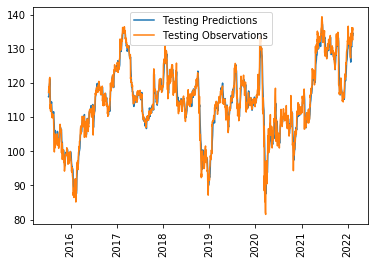

In [54]:
plt.plot(df_test.index, y_pre20)
plt.plot(df_test.index, y_test)
plt.xticks(rotation=90)
plt.legend(['Testing Predictions', 'Testing Observations'])

In [55]:
test_results20 = pd.DataFrame(data={'Test Predictions':y_pre20, 'Actuals':y_test},index=df_test.index)
test_results20

,Test Predictions,Actuals
Date,,
2015-07-10,115.949821,117.197418
2015-07-13,116.036835,118.903267
2015-07-14,117.219833,118.362709
2015-07-15,118.339272,118.306519
2015-07-16,118.842133,120.040489
...,...,...
2022-02-07,134.005280,135.606552
2022-02-08,134.521240,135.389175
2022-02-09,134.403671,136.149994


In [56]:
rmse20=np.sqrt(np.mean(((test_results20['Test Predictions']- test_results20['Actuals'])**2)))
mae20 = np.mean(np.abs(test_results20['Test Predictions']-test_results20['Actuals']))
MAPE20 = np.mean(np.abs(((test_results20['Test Predictions']-test_results20['Actuals'])/test_results20['Actuals'])*100))
r2_20 = r2_score(test_results20['Actuals'], test_results20['Test Predictions'])
rmse20, mae20, MAPE20, r2_20

(2.369826302054646, 1.6283512230240762, 1.4540463216866362, 0.9485802985774495)

In [57]:
Create_X_y(3)

([array([[0.29800615, 0.27453328, 0.65551751, 0.7323172 , 0.62215098,
          0.66840594, 0.48473988],
         [0.30144991, 0.27604566, 0.66278378, 0.6605462 , 0.50542608,
          0.63209336, 0.48440236],
         [0.30677204, 0.27627285, 0.67412444, 0.50444192, 0.38579014,
          0.61957577, 0.53415843],
         [0.29988473, 0.27696616, 0.6551758 , 0.42271751, 0.38492646,
          0.58910683, 0.46156415],
         [0.30489347, 0.27712503, 0.66634048, 0.4068408 , 0.45934015,
          0.57416311, 0.42437784],
         [0.28360508, 0.27687357, 0.60875818, 0.38334822, 0.31759736,
          0.58698464, 0.38589977],
         [0.27609143, 0.27643982, 0.58944533, 0.34672277, 0.27861237,
          0.59182323, 0.38532626],
         [0.26482107, 0.27477714, 0.56107614, 0.22684238, 0.11135887,
          0.56883311, 0.29121595],
         [0.27358679, 0.27325129, 0.58294857, 0.16523859, 0.13877772,
          0.55141133, 0.33335382],
         [0.26106419, 0.27117895, 0.55147668, 0.1236353

In [58]:
X, y =np.array(X), np.array(y)
df_scaled.shape, X.shape, y.shape

((3875, 7), (3845, 30, 7), (3845, 1))

In [59]:
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])

In [61]:
model.fit(X, y, epochs=20, batch_size=64)

Train on 3845 samples
Epoch 1/20
3845/3845 [==============================] - 15s 4ms/sample - loss: 5.0917e-04 - mean_absolute_error: 0.0167
Epoch 2/20
3845/3845 [==============================] - 15s 4ms/sample - loss: 3.2151e-04 - mean_absolute_error: 0.0130
Epoch 3/20
3845/3845 [==============================] - 25s 7ms/sample - loss: 3.1432e-04 - mean_absolute_error: 0.0130
Epoch 4/20
3845/3845 [==============================] - 35s 9ms/sample - loss: 2.8542e-04 - mean_absolute_error: 0.0124
Epoch 5/20
3845/3845 [==============================] - 18s 5ms/sample - loss: 3.1372e-04 - mean_absolute_error: 0.0133
Epoch 6/20
3845/3845 [==============================] - 15s 4ms/sample - loss: 2.7551e-04 - mean_absolute_error: 0.0121
Epoch 7/20
3845/3845 [==============================] - 13s 3ms/sample - loss: 2.8895e-04 - mean_absolute_error: 0.0125
Epoch 8/20
3845/3845 [==============================] - 12s 3ms/sample - loss: 3.0103e-04 - mean_absolute_error: 0.0129
Epoch 9/20
3845/38

In [62]:
inputs = dataset_total[len(dataset_total)-len(df_test)-30:].values
inputs.shape

(1692, 7)

In [63]:
inputs = scaler.transform(inputs)

In [64]:
X_test = []
for i in range(30,len(inputs)):
    X_test.append(inputs[i-30:i, :])

In [65]:
X_test = np.array(X_test)

In [66]:
test_predictions30 = model.predict(X_test)

In [67]:
forecast_copies = np.repeat(test_predictions30, df_scaled.shape[1], axis=-1)
y_pre30 = scaler.inverse_transform(forecast_copies)[:,0]  
y_pre30

array([113.50245 , 113.618996, 114.89343 , ..., 130.96704 , 131.083   ,
       130.3158  ], dtype=float32)

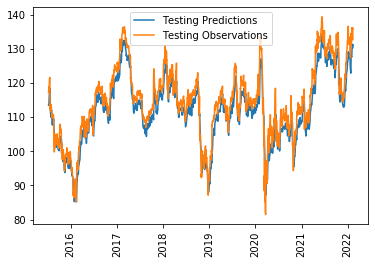

In [69]:
plt.plot(df_test.index, y_pre30)
plt.plot(df_test.index, y_test)
plt.xticks(rotation=90)
plt.legend(['Testing Predictions', 'Testing Observations'])

In [70]:
test_results30 = pd.DataFrame(data={'Test Predictions':y_pre30, 'Actuals':y_test},index=df_test.index)
test_results30

,Test Predictions,Actuals
Date,,
2015-07-10,113.502449,117.197418
2015-07-13,113.618996,118.903267
2015-07-14,114.893433,118.362709
2015-07-15,116.004883,118.306519
2015-07-16,116.396988,120.040489
...,...,...
2022-02-07,130.896027,135.606552
2022-02-08,131.315414,135.389175
2022-02-09,130.967041,136.149994


In [71]:
rmse30=np.sqrt(np.mean(((test_results30['Test Predictions']- test_results30['Actuals'])**2)))
mae30 = np.mean(np.abs(test_results30['Test Predictions']-test_results30['Actuals']))
MAPE30 = np.mean(np.abs(((test_results30['Test Predictions']-test_results30['Actuals'])/test_results30['Actuals'])*100))
r2_30 = r2_score(test_results30['Actuals'], test_results30['Test Predictions'])
rmse30, mae30, MAPE30, r2_30

(3.7319367616968226,
 3.2070770263671866,
 2.7873978750520494,
 0.8724838852612344)

In [72]:
Create_X_y(4)

([array([[0.29800615, 0.27453328, 0.65551751, 0.7323172 , 0.62215098,
          0.66840594, 0.48473988],
         [0.30144991, 0.27604566, 0.66278378, 0.6605462 , 0.50542608,
          0.63209336, 0.48440236],
         [0.30677204, 0.27627285, 0.67412444, 0.50444192, 0.38579014,
          0.61957577, 0.53415843],
         [0.29988473, 0.27696616, 0.6551758 , 0.42271751, 0.38492646,
          0.58910683, 0.46156415],
         [0.30489347, 0.27712503, 0.66634048, 0.4068408 , 0.45934015,
          0.57416311, 0.42437784],
         [0.28360508, 0.27687357, 0.60875818, 0.38334822, 0.31759736,
          0.58698464, 0.38589977],
         [0.27609143, 0.27643982, 0.58944533, 0.34672277, 0.27861237,
          0.59182323, 0.38532626],
         [0.26482107, 0.27477714, 0.56107614, 0.22684238, 0.11135887,
          0.56883311, 0.29121595],
         [0.27358679, 0.27325129, 0.58294857, 0.16523859, 0.13877772,
          0.55141133, 0.33335382],
         [0.26106419, 0.27117895, 0.55147668, 0.1236353

In [73]:
X, y =np.array(X), np.array(y)
df_scaled.shape, X.shape, y.shape

((3875, 7), (3815, 60, 7), (3815, 1))

In [74]:
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])

In [75]:
model.fit(X, y, epochs=20, batch_size=64)

Train on 3815 samples
Epoch 1/20
3815/3815 [==============================] - 20s 5ms/sample - loss: 0.0039 - mean_absolute_error: 0.0375
Epoch 2/20
3815/3815 [==============================] - 16s 4ms/sample - loss: 4.2529e-04 - mean_absolute_error: 0.0151
Epoch 3/20
3815/3815 [==============================] - 16s 4ms/sample - loss: 3.5137e-04 - mean_absolute_error: 0.0136
Epoch 4/20
3815/3815 [==============================] - 17s 4ms/sample - loss: 3.2816e-04 - mean_absolute_error: 0.0133
Epoch 5/20
3815/3815 [==============================] - 17s 4ms/sample - loss: 2.9315e-04 - mean_absolute_error: 0.0126
Epoch 6/20
3815/3815 [==============================] - 17s 5ms/sample - loss: 3.1403e-04 - mean_absolute_error: 0.0132
Epoch 7/20
3815/3815 [==============================] - 16s 4ms/sample - loss: 2.8371e-04 - mean_absolute_error: 0.0123
Epoch 8/20
3815/3815 [==============================] - 19s 5ms/sample - loss: 2.8357e-04 - mean_absolute_error: 0.0123
Epoch 9/20
3815/3815 [

In [76]:
inputs = dataset_total[len(dataset_total)-len(df_test)-60:].values

In [77]:
inputs = scaler.transform(inputs)

In [78]:
X_test = []
for i in range(60,len(inputs)):
    X_test.append(inputs[i-60:i, :])

In [79]:
X_test = np.array(X_test)

In [80]:
test_predictions60 = model.predict(X_test)

In [81]:
forecast_copies = np.repeat(test_predictions60, df_scaled.shape[1], axis=-1)
y_pre60 = scaler.inverse_transform(forecast_copies)[:,0]  
y_pre60

array([115.67827, 115.83755, 117.17144, ..., 133.71376, 133.9238 ,
       133.16908], dtype=float32)

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


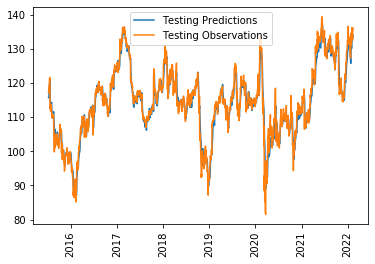

In [82]:
plt.plot(df_test.index, y_pre60)
plt.plot(df_test.index, y_test)
plt.xticks(rotation=90)
plt.legend(['Testing Predictions', 'Testing Observations'])

In [83]:
test_results60 = pd.DataFrame(data={'Test Predictions':y_pre60, 'Actuals':y_test},index=df_test.index)
test_results60

,Test Predictions,Actuals
Date,,
2015-07-10,115.678268,117.197418
2015-07-13,115.837547,118.903267
2015-07-14,117.171440,118.362709
2015-07-15,118.353867,118.306519
2015-07-16,118.796349,120.040489
...,...,...
2022-02-07,133.549225,135.606552
2022-02-08,133.944550,135.389175
2022-02-09,133.713760,136.149994


In [84]:
rmse60=np.sqrt(np.mean(((test_results60['Test Predictions']- test_results60['Actuals'])**2)))
mae60 = np.mean(np.abs(test_results60['Test Predictions']-test_results60['Actuals']))
MAPE60 = np.mean(np.abs(((test_results60['Test Predictions']-test_results60['Actuals'])/test_results60['Actuals'])*100))
r2_60 = r2_score(test_results60['Actuals'], test_results60['Test Predictions'])
rmse60, mae60, MAPE60, r2_60

(2.4789533078648986, 1.7069956828827748, 1.519934299757668, 0.9437356619980053)

In [85]:
index_bar = [5,10,20,30,60]

rmse = [rmse5,rmse10,rmse20,rmse30,rmse60]
mae = [mae5,mae10,mae20,mae30,mae60]
MAPE = [MAPE5,MAPE10,MAPE20,MAPE30,MAPE60]
r2 = [r2_5,r2_10,r2_20,r2_30,r2_60]

df_bar = pd.DataFrame(data={'rmse':rmse, 'mae':mae, 'MAPE':MAPE, 'r2':r2},index=index_bar)
df_bar

,rmse,mae,MAPE,r2
5,2.331257,1.602619,1.437671,0.950240
10,2.534711,1.742782,1.560108,0.941176
20,2.369826,1.628351,1.454046,0.948580
30,3.731937,3.207077,2.787398,0.872484
60,2.478953,1.706996,1.519934,0.943736


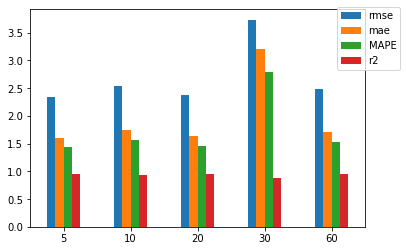

In [86]:
ax = df_bar.plot.bar(rot=0)
ax.legend(loc='best', bbox_to_anchor=(0.9, 0.7))
plt.savefig('Daily DATASET TECNICI PERFORMANCE MATRICS3.png')

In [ ]:
### SCELGO 20 GIORNI LOOK BACK

In [87]:
Create_X_y(2)

([array([[0.29800615, 0.27453328, 0.65551751, 0.7323172 , 0.62215098,
          0.66840594, 0.48473988],
         [0.30144991, 0.27604566, 0.66278378, 0.6605462 , 0.50542608,
          0.63209336, 0.48440236],
         [0.30677204, 0.27627285, 0.67412444, 0.50444192, 0.38579014,
          0.61957577, 0.53415843],
         [0.29988473, 0.27696616, 0.6551758 , 0.42271751, 0.38492646,
          0.58910683, 0.46156415],
         [0.30489347, 0.27712503, 0.66634048, 0.4068408 , 0.45934015,
          0.57416311, 0.42437784],
         [0.28360508, 0.27687357, 0.60875818, 0.38334822, 0.31759736,
          0.58698464, 0.38589977],
         [0.27609143, 0.27643982, 0.58944533, 0.34672277, 0.27861237,
          0.59182323, 0.38532626],
         [0.26482107, 0.27477714, 0.56107614, 0.22684238, 0.11135887,
          0.56883311, 0.29121595],
         [0.27358679, 0.27325129, 0.58294857, 0.16523859, 0.13877772,
          0.55141133, 0.33335382],
         [0.26106419, 0.27117895, 0.55147668, 0.1236353

In [88]:
X, y =np.array(X), np.array(y)
df_scaled.shape, X.shape, y.shape

((3875, 7), (3855, 20, 7), (3855, 1))

In [89]:
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_10 (LSTM)               (None, 20, 100)           43200     
_________________________________________________________________
lstm_11 (LSTM)               (None, 20)                9680      
_________________________________________________________________
dense_10 (Dense)             (None, 25)                525       
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 26        
Total params: 53,431
Trainable params: 53,431
Non-trainable params: 0
_________________________________________________________________


In [90]:
model.fit(X, y, epochs=30, batch_size=64)

Train on 3855 samples
Epoch 1/30
3855/3855 [==============================] - 9s 2ms/sample - loss: 0.0127 - mean_absolute_error: 0.0667
Epoch 2/30
3855/3855 [==============================] - 6s 1ms/sample - loss: 5.7779e-04 - mean_absolute_error: 0.0180
Epoch 3/30
3855/3855 [==============================] - 6s 1ms/sample - loss: 4.6953e-04 - mean_absolute_error: 0.0159
Epoch 4/30
3855/3855 [==============================] - 6s 1ms/sample - loss: 4.1758e-04 - mean_absolute_error: 0.0149
Epoch 5/30
3855/3855 [==============================] - 6s 1ms/sample - loss: 3.6372e-04 - mean_absolute_error: 0.0139
Epoch 6/30
3855/3855 [==============================] - 6s 2ms/sample - loss: 3.6003e-04 - mean_absolute_error: 0.0139
Epoch 7/30
3855/3855 [==============================] - 6s 2ms/sample - loss: 3.2007e-04 - mean_absolute_error: 0.0129
Epoch 8/30
3855/3855 [==============================] - 8s 2ms/sample - loss: 3.2736e-04 - mean_absolute_error: 0.0132
Epoch 9/30
3855/3855 [========

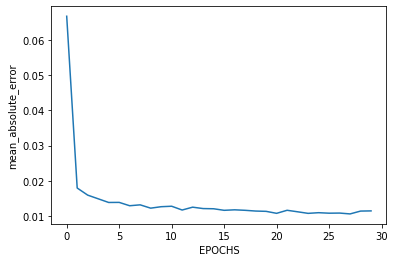

In [91]:
loss_per_epoch = model.history.history['mean_absolute_error']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)
plt.xlabel('EPOCHS')
plt.ylabel('mean_absolute_error')
plt.savefig('DATASET TECNICO mean absolute error (buono).png')

In [92]:
from datetime import datetime
a = [5,10,20,30]
minutes = []
for i in a:
    start_time = datetime.now()
    model.fit(X, y, epochs=i, batch_size=64)
    end_time = datetime.now()
    minutes.append(end_time - start_time)

Train on 3855 samples
Epoch 1/5
3855/3855 [==============================] - 10s 3ms/sample - loss: 2.4424e-04 - mean_absolute_error: 0.0116
Epoch 2/5
3855/3855 [==============================] - 9s 2ms/sample - loss: 2.1479e-04 - mean_absolute_error: 0.0108
Epoch 3/5
3855/3855 [==============================] - 10s 3ms/sample - loss: 1.9262e-04 - mean_absolute_error: 0.0101
Epoch 4/5
3855/3855 [==============================] - 10s 3ms/sample - loss: 1.8999e-04 - mean_absolute_error: 0.0100
Epoch 5/5
3855/3855 [==============================] - 9s 2ms/sample - loss: 2.0270e-04 - mean_absolute_error: 0.0105
Train on 3855 samples
Epoch 1/10
3855/3855 [==============================] - 9s 2ms/sample - loss: 1.9024e-04 - mean_absolute_error: 0.0100
Epoch 2/10
3855/3855 [==============================] - 15s 4ms/sample - loss: 1.8608e-04 - mean_absolute_error: 0.0099
Epoch 3/10
3855/3855 [==============================] - 11s 3ms/sample - loss: 2.1401e-04 - mean_absolute_error: 0.0107
Epoc

In [93]:
epochs = [5,10,20,30]

df_epoch = pd.DataFrame(data={'Epoch':epochs},index=minutes)
df_epoch

,Epoch
0 days 00:00:48.877297,5
0 days 00:01:48.898949,10
0 days 00:03:26.828684,20
0 days 00:05:26.862160,30


In [94]:
time_sec = []
for i in df_epoch.index:
    a = i.total_seconds()
    time_sec.append(a)

In [95]:
time_sec

[48.877297, 108.898949, 206.828684, 326.86216]

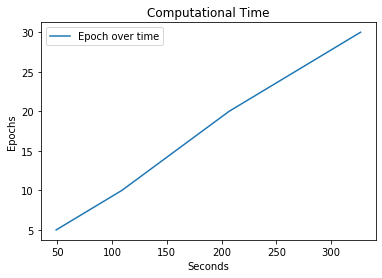

In [96]:
plt.plot(time_sec, epochs)
plt.xlabel('Seconds')
plt.ylabel('Epochs')
plt.title('Computational Time')
plt.legend(['Epoch over time'])
plt.savefig('DATASET TECNICO epochs vs time.png')

In [ ]:
## SCELGO 20 EPOCH 

In [97]:
model = Sequential()
model.add(LSTM(100, return_sequences=True, input_shape=(X.shape[1],X.shape[2])))
model.add(LSTM(20, return_sequences=False))
model.add(Dense(25))
model.add(Dense(1))
model.compile(loss='mse', 
              optimizer='adam',
              metrics=['mean_absolute_error'])
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_12 (LSTM)               (None, 20, 100)           43200     
_________________________________________________________________
lstm_13 (LSTM)               (None, 20)                9680      
_________________________________________________________________
dense_12 (Dense)             (None, 25)                525       
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 26        
Total params: 53,431
Trainable params: 53,431
Non-trainable params: 0
_________________________________________________________________


In [98]:
model.fit(X, y, epochs=20, batch_size=64)

Train on 3855 samples
Epoch 1/20
3855/3855 [==============================] - 9s 2ms/sample - loss: 0.0187 - mean_absolute_error: 0.0762
Epoch 2/20
3855/3855 [==============================] - 7s 2ms/sample - loss: 7.2422e-04 - mean_absolute_error: 0.0201
Epoch 3/20
3855/3855 [==============================] - 7s 2ms/sample - loss: 5.0004e-04 - mean_absolute_error: 0.0167
Epoch 4/20
3855/3855 [==============================] - 6s 2ms/sample - loss: 3.9884e-04 - mean_absolute_error: 0.0146
Epoch 5/20
3855/3855 [==============================] - 6s 2ms/sample - loss: 3.4647e-04 - mean_absolute_error: 0.0135
Epoch 6/20
3855/3855 [==============================] - 7s 2ms/sample - loss: 3.0185e-04 - mean_absolute_error: 0.0125
Epoch 7/20
3855/3855 [==============================] - 7s 2ms/sample - loss: 2.9677e-04 - mean_absolute_error: 0.0125
Epoch 8/20
3855/3855 [==============================] - 7s 2ms/sample - loss: 2.7907e-04 - mean_absolute_error: 0.0121
Epoch 9/20
3855/3855 [========

In [100]:
inputs20 = dataset_total[len(dataset_total)-len(df_test)-20:].values
inputs20.shape

(1682, 7)

In [101]:
inputs = scaler.transform(inputs20)

In [102]:
X_test = []
for i in range(20,len(inputs)):
    X_test.append(inputs[i-20:i, :])

In [103]:
X_test = np.array(X_test)

In [104]:
test_predictions20 = model.predict(X_test)

In [106]:
forecast_copies = np.repeat(test_predictions20, df_scaled.shape[1], axis=-1)
y_pre20 = scaler.inverse_transform(forecast_copies)[:,0]  
y_pre20

array([116.41034, 116.49465, 117.60665, ..., 134.57826, 134.73215,
       133.9705 ], dtype=float32)

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  ndim = x[:, None].ndim
/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


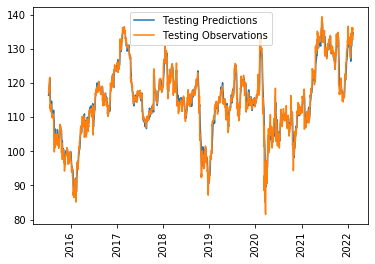

In [136]:
plt.plot(df_test.index, y_pre20)
plt.plot(df_test.index, y_test)
plt.xticks(rotation=90)
plt.legend(['Testing Predictions', 'Testing Observations'])
plt.savefig('Dataset tecnico.png')

In [108]:
test_results20 = pd.DataFrame(data={'Test Predictions':y_pre20, 'Actuals':y_test},index=df_test.index)
test_results20

,Test Predictions,Actuals
Date,,
2015-07-10,116.410339,117.197418
2015-07-13,116.494652,118.903267
2015-07-14,117.606651,118.362709
2015-07-15,118.653534,118.306519
2015-07-16,119.142334,120.040489
...,...,...
2022-02-07,134.209381,135.606552
2022-02-08,134.727951,135.389175
2022-02-09,134.578262,136.149994


In [109]:
rmse20=np.sqrt(np.mean(((test_results20['Test Predictions']- test_results20['Actuals'])**2)))
mae20 = np.mean(np.abs(test_results20['Test Predictions']-test_results20['Actuals']))
MAPE20 = np.mean(np.abs(((test_results20['Test Predictions']-test_results20['Actuals'])/test_results20['Actuals'])*100))
r2_20 = r2_score(test_results20['Actuals'], test_results20['Test Predictions'])
rmse20, mae20, MAPE20, r2_20

(2.4301505459299264, 1.6535280964434786, 1.481278988600094, 0.9459291897879152)

In [111]:
prezzo = []
for i in test_results20['Actuals']:
    prezzo.append(i)

strategy_act=[]
i=1
while i < len(prezzo):
    if prezzo[i]>prezzo[i-1]:
        strategy_act.append(1)
    else:
        strategy_act.append(-1)
    i=i+1

In [112]:
prezzo_pre = []
for i in test_results20['Test Predictions']:
    prezzo_pre.append(i) 

strategy_pre=[]
i=1
while i < len(prezzo_pre):
    if prezzo_pre[i]>prezzo_pre[i-1]:
        strategy_pre.append(1)
    else:
        strategy_pre.append(-1)
    i=i+1

In [114]:
test_results20 = test_results20[1:]

In [115]:
test_results20['Strategy Pre'] = strategy_pre

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [116]:
test_results20['Strategy Act'] = strategy_act

/Users/schisanoluca/opt/anaconda3/envs/Dataprediction/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [129]:
test_results20

,Test Predictions,Actuals,Strategy Pre,Strategy Act,Open
Date,,,,,
2015-07-10,116.410339,117.197418,1,1,158.374756
2015-07-13,116.494652,118.903267,1,0,160.544937
2015-07-14,117.606651,118.362709,1,0,161.978973
2015-07-15,118.653534,118.306519,1,1,161.070740
2015-07-16,119.142334,120.040489,1,1,162.017212
...,...,...,...,...,...
2022-02-04,133.329285,135.517609,1,1,137.860001
2022-02-07,134.209381,135.606552,1,0,137.449997
2022-02-08,134.727951,135.389175,0,1,137.229996


In [117]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_results20['Strategy Act'], test_results20['Strategy Pre'])
cm

array([[368, 424],
       [424, 445]])

In [119]:
from sklearn.metrics import accuracy_score, precision_score, recall_score
print(accuracy_score(test_results20['Strategy Act'], test_results20['Strategy Pre']))
print(precision_score(test_results20['Strategy Act'], test_results20['Strategy Pre']))
print(recall_score(test_results20['Strategy Act'], test_results20['Strategy Pre']))

0.48946417820590005
0.5120828538550057
0.5120828538550057
